In [ ]:
from google.colab import drive
drive.mount('/content/drive/')


Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


# Import Required Libraries

In [ ]:
import os
import numpy as np
import cv2
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, concatenate
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow

# Let Visualize the data

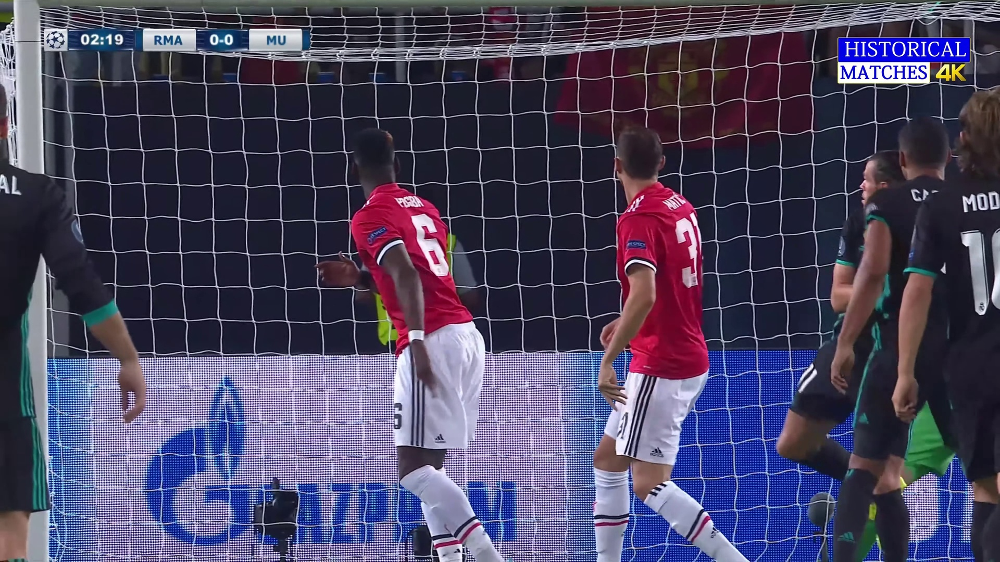

In [ ]:
# Visualizing first image
image_path = '/content/drive/MyDrive/ColabNotebooks/ImageSegmentation/ImageSegmentationData/images/Frame 1  (1).jpg'
org_image = cv2.imread(image_path)
cv2_imshow(org_image)

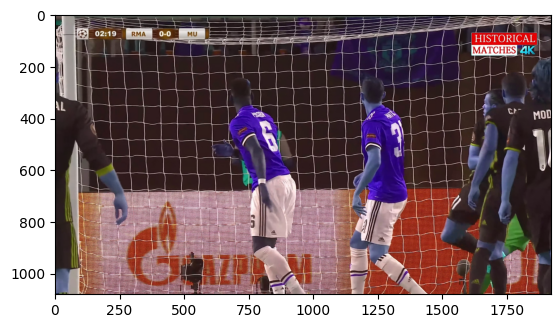

In [ ]:
# It changes the color of image? plt displays image in BGR Format
plt.imshow(org_image)

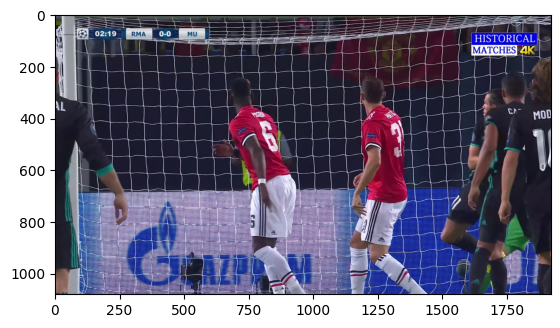

In [ ]:
# This code shows the original color of the image. It converts BGR to RGB
plt.imshow(cv2.cvtColor(org_image, cv2.COLOR_BGR2RGB))

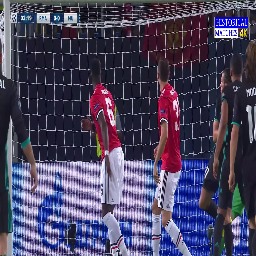

In [ ]:
# Reducing the size of image
resized_image = cv2.resize(org_image, (256, 256))  # adjust the size as needed
cv2_imshow(resized_image)

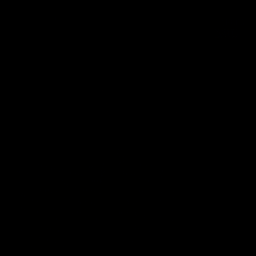

In [ ]:
# Normalizing the image values between 0 and 1. Here image is black so to view normalized image we will use plt.imshow

# normalized_image = (resized_image / 127.5) - 1.0  # Normalize between -1 and 1
normalized_image = (resized_image / 255.0)   # Normalize between 0 and 1 if original pixel values are in the range [0, 255]
cv2_imshow(normalized_image)

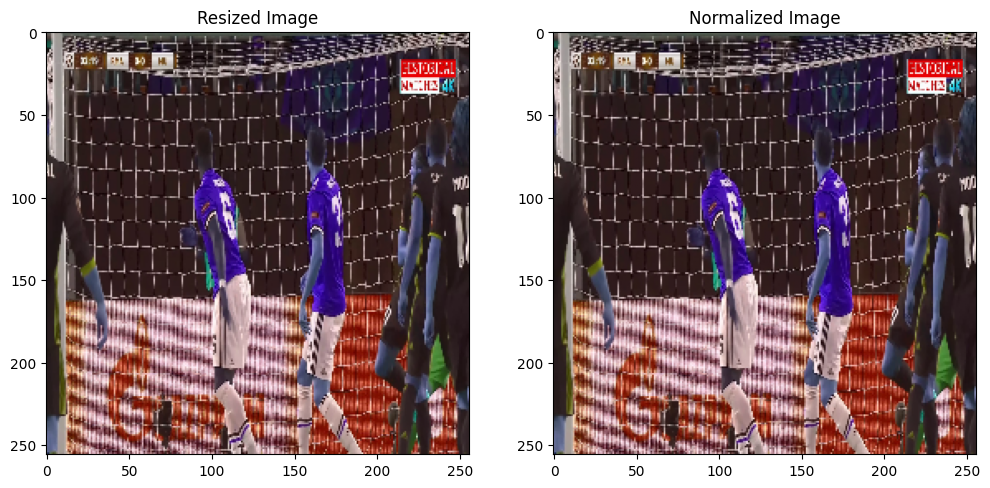

In [ ]:
# Display the original and normalized images side by side

plt.figure(figsize=(12, 12))

plt.subplot(1, 2, 1)
plt.imshow(resized_image)
plt.title('Resized Image')

plt.subplot(1, 2, 2)
plt.imshow(normalized_image)
plt.title('Normalized Image')

plt.show()

In [ ]:
# Difference of values in between resized and normalized image
print(resized_image[0][0]) # Range 0- 255
print(normalized_image[0][0]) # Range 0 to 1
# But the Results are same

[ 69 108  98]
[0.27058824 0.42352941 0.38431373]


# Loading all images

In [ ]:
def load_data(folder_path, image_suffix):
    org_images = []
    resized_images = []
    normalized_images = []


    for filename in os.listdir(folder_path):
        if filename.endswith(image_suffix): # image_suffix = ).jpg
            image_path = os.path.join(folder_path, filename)

            # Read and preprocess images
            image = cv2.imread(image_path)
            print(f"Successfully loaded image for {filename}")
            org_images.append(image)
            image = cv2.resize(image, (256, 256))  # adjust the size as needed
            resized_images.append(image)
            image = image / 255.0  # normalize to [0, 1]
            normalized_images.append(image)
        else:
          print(f"Excluded File: {filename}")



    return org_images, resized_images, normalized_images



In [ ]:
# Specify your data folder and suffixes
data_folder = '/content/drive/MyDrive/ColabNotebooks/ImageSegmentation/ImageSegmentationData/images'
image_suffix = ').jpg'


In [ ]:
org_images, resized_images, normalized_images = load_data(data_folder, image_suffix)


Excluded File: Frame 1  (19).jpg___fuse.png
Successfully loaded image for Frame 1  (12).jpg
Successfully loaded image for Frame 1  (100).jpg
Successfully loaded image for Frame 1  (16).jpg
Successfully loaded image for Frame 1  (20).jpg
Excluded File: Frame 1  (13).jpg___fuse.png
Successfully loaded image for Frame 1  (13).jpg
Excluded File: Frame 1  (18).jpg___save.png
Excluded File: Frame 1  (18).jpg___fuse.png
Successfully loaded image for Frame 1  (17).jpg
Successfully loaded image for Frame 1  (19).jpg
Excluded File: Frame 1  (2).jpg___save.png
Excluded File: Frame 1  (10).jpg___fuse.png
Successfully loaded image for Frame 1  (23).jpg
Excluded File: Frame 1  (14).jpg___save.png
Successfully loaded image for Frame 1  (2).jpg
Excluded File: Frame 1  (20).jpg___fuse.png
Excluded File: Frame 1  (14).jpg___fuse.png
Successfully loaded image for Frame 1  (22).jpg
Excluded File: Frame 1  (16).jpg___save.png
Excluded File: Frame 1  (17).jpg___save.png
Excluded File: Frame 1  (11).jpg___sa

In [ ]:
print('----------------------------')
print('Total number of images: ', len(org_images))
print('----------------------------')
print('Original Image Length',len(org_images))
print('Resized Image Length',len(resized_images))
print('Normalized Image Length',len(normalized_images))

----------------------------
Total number of images:  100
----------------------------
Original Image Length 100
Resized Image Length 100
Normalized Image Length 100


In [ ]:
print('Original Image Length',type(org_images))
print('Resized Image Length',type(resized_images))
print('Normalized Image Length',type(normalized_images))

Original Image Length <class 'list'>
Resized Image Length <class 'list'>
Normalized Image Length <class 'list'>


In [ ]:
# Dimensions
num_rows = len(org_images)
num_columns = len(org_images[0])
print('Original Image Dimeensions:', num_rows, num_columns)



num_rows = len(resized_images)
num_columns = len(resized_images[0])
print('Resized Image Dimeensions:', num_rows, num_columns)

num_rows = len(normalized_images)
num_columns = len(normalized_images[0])
print('Normalized Image Dimeensions:', num_rows, num_columns)




Original Image Dimeensions: 100 1080
Resized Image Dimeensions: 100 256
Normalized Image Dimeensions: 100 256


In [ ]:
print('Original Image Type',type(org_images[29]))
print('Resized Image Type',type(resized_images[29]))
print('Normalized Image Type',type(normalized_images[29]))

Original Image Type <class 'numpy.ndarray'>
Resized Image Type <class 'numpy.ndarray'>
Normalized Image Type <class 'numpy.ndarray'>


In [ ]:
print('Original Image Dimensions: ',org_images[29].shape)
print('Resized Image Dimenions: ',resized_images[29].shape)
print('Normalized Image Dimensions: ',normalized_images[29].shape)


Original Image Dimensions:  (1080, 1920, 3)
Resized Image Dimenions:  (256, 256, 3)
Normalized Image Dimensions:  (256, 256, 3)


In [ ]:
print('Original Image Data: \n',org_images[29])
print('\nResized Image Data: \n',resized_images[29])
print('\nNormalized Image Data: \n',normalized_images[29])

Original Image Data: 
 [[[ 78  60  43]
  [ 77  59  42]
  [ 78  60  43]
  ...
  [ 52  43  30]
  [ 51  43  30]
  [ 51  43  30]]

 [[ 98  78  61]
  [ 98  78  61]
  [ 97  77  60]
  ...
  [ 52  43  30]
  [ 51  43  30]
  [ 51  43  30]]

 [[ 83  61  43]
  [ 85  63  45]
  [ 87  65  47]
  ...
  [ 52  43  30]
  [ 51  43  30]
  [ 51  43  30]]

 ...

 [[ 54 113  82]
  [ 56 115  84]
  [ 52 112  81]
  ...
  [ 40 116  84]
  [ 40 116  84]
  [ 39 115  83]]

 [[ 66 125  94]
  [ 65 124  93]
  [ 60 119  88]
  ...
  [ 44 123  90]
  [ 43 122  89]
  [ 43 122  89]]

 [[ 70 129  98]
  [ 68 127  96]
  [ 64 123  92]
  ...
  [ 41 120  87]
  [ 39 118  85]
  [ 40 119  86]]]

Resized Image Data: 
 [[[ 89  69  52]
  [ 84  69  54]
  [ 82  68  53]
  ...
  [ 44  38  31]
  [ 49  42  31]
  [ 52  43  30]]

 [[ 97  66  44]
  [ 94  66  46]
  [ 92  65  46]
  ...
  [ 47  44  36]
  [ 49  45  34]
  [ 52  43  30]]

 [[100  70  43]
  [100  70  45]
  [102  71  46]
  ...
  [ 49  43  36]
  [ 45  43  32]
  [ 54  42  30]]

 ...

 [[ 68

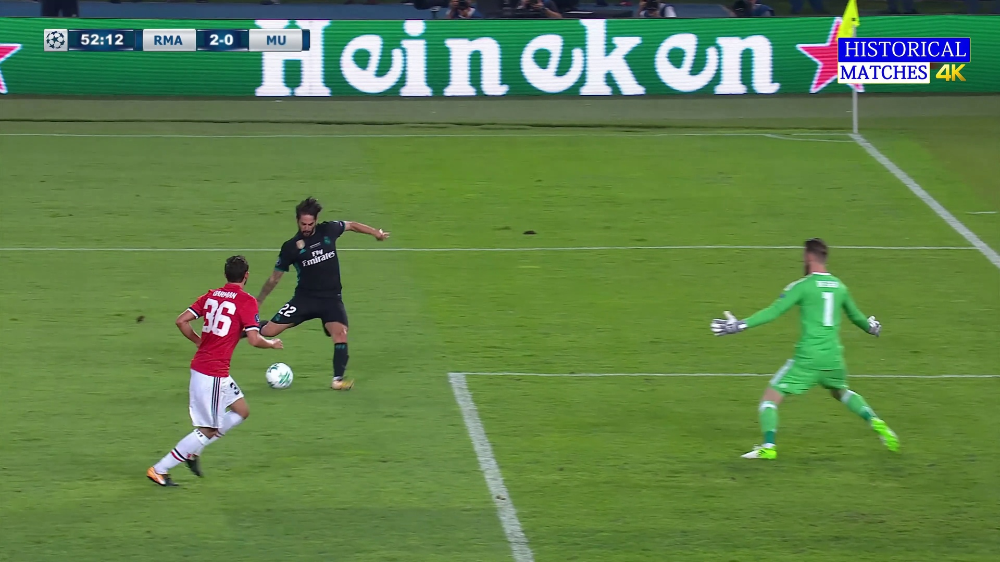

In [ ]:
# plt.imshow display this picture with different color ?
cv2_imshow(org_images[29])

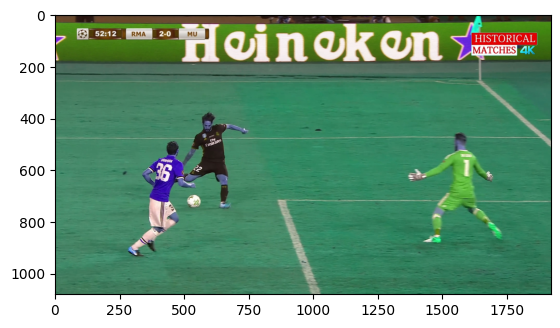

In [ ]:
plt.imshow(org_images[29]) # Same image but different color

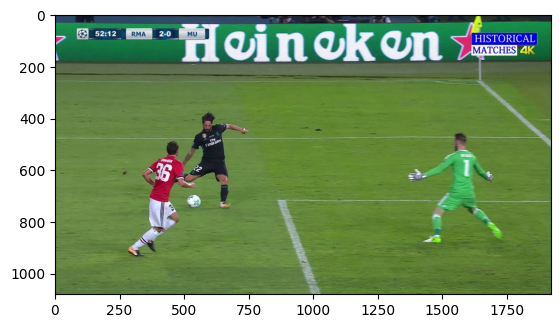

In [ ]:
image = cv2.cvtColor(org_images[29], cv2.COLOR_BGR2RGB)  # Assuming BGR format, convert to RGB for displaying
plt.imshow(image)

In [ ]:
# Change behind above code
print('Before:',org_images[29][0])
image = cv2.cvtColor(org_images[0], cv2.COLOR_BGR2RGB)  # Assuming BGR format, convert to RGB for displaying
print('After: ',image[0])

Before: [[78 60 43]
 [77 59 42]
 [78 60 43]
 ...
 [52 43 30]
 [51 43 30]
 [51 43 30]]
After:  [[37 32 38]
 [37 32 38]
 [37 32 39]
 ...
 [ 8 40 65]
 [ 8 40 65]
 [ 8 40 65]]


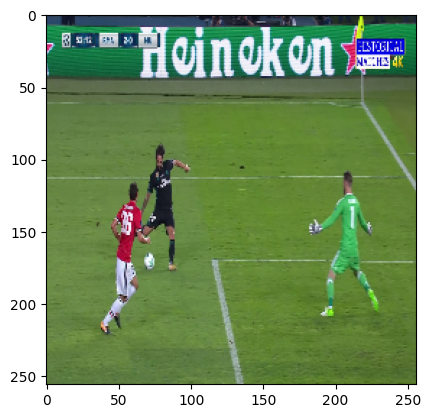

In [ ]:
image = cv2.cvtColor(resized_images[29], cv2.COLOR_BGR2RGB)  # Assuming BGR format, convert to RGB for displaying
plt.imshow(image)

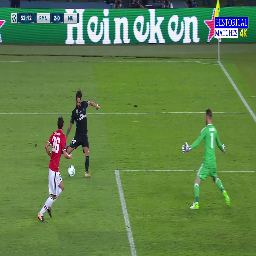

In [ ]:
# When we use cv2_imshow, we don't need to change the image format
cv2_imshow(resized_images[29])

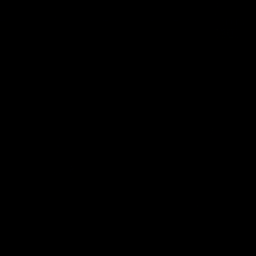

In [ ]:
cv2_imshow(normalized_images[29])

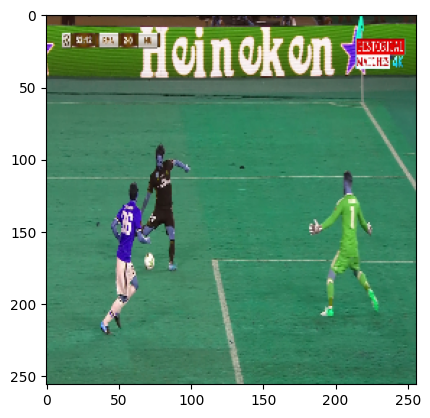

In [ ]:
plt.imshow(normalized_images[29])

In [ ]:
# We can't apply formatting on normalized image becuase normalized images range between 0 and 1
image = cv2.cvtColor(normalized_images[29], cv2.COLOR_BGR2RGB)
plt.imshow(image)

error: ignored

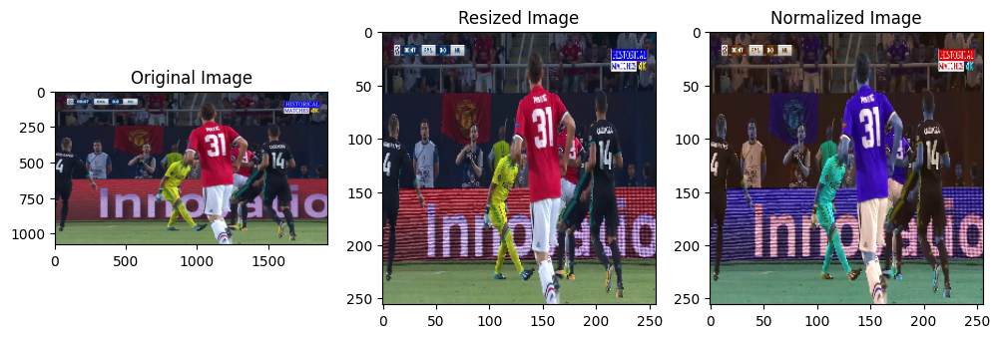

In [ ]:
# All processed images in one cell
plt.figure(figsize=(12,12))
plt.subplot(1, 3, 1)
plt.title('Original Image')
plt.imshow(cv2.cvtColor(org_images[0], cv2.COLOR_BGR2RGB))
plt.axis('on')

plt.subplot(1, 3, 2)
plt.title('Resized Image')
plt.imshow(cv2.cvtColor(resized_images[0], cv2.COLOR_BGR2RGB))
plt.axis('on')

plt.subplot(1, 3, 3)
plt.title('Normalized Image')
plt.imshow(normalized_images[0])
plt.axis('on')

plt.show()

# Getting those images that are required for training

In [ ]:
def load_data(folder_path, image_suffix):
    images = []

    for filename in os.listdir(folder_path):
        if filename.endswith(image_suffix): # image_suffix = fuse.png
            image_path = os.path.join(folder_path, filename)

            # Read and preprocess images
            image = cv2.imread(image_path)
            print(f"Successfully loaded image for {filename}")
            image = cv2.resize(image, (256, 256))  # adjust the size as needed
            image = image / 255.0  # normalize to [0, 1]
            images.append(image)
        else:
          print(f"Excluded File: {filename}")

    return images, np.array(images)



In [ ]:
# Specify your data folder and suffixes
data_folder = '/content/drive/MyDrive/ColabNotebooks/ImageSegmentation/ImageSegmentationData/images'
image_suffix = 'fuse.png'


In [ ]:
images, np_images = load_data(data_folder, image_suffix)

Successfully loaded image for Frame 1  (19).jpg___fuse.png
Excluded File: Frame 1  (12).jpg
Excluded File: Frame 1  (100).jpg
Excluded File: Frame 1  (16).jpg
Excluded File: Frame 1  (20).jpg
Successfully loaded image for Frame 1  (13).jpg___fuse.png
Excluded File: Frame 1  (13).jpg
Excluded File: Frame 1  (18).jpg___save.png
Successfully loaded image for Frame 1  (18).jpg___fuse.png
Excluded File: Frame 1  (17).jpg
Excluded File: Frame 1  (19).jpg
Excluded File: Frame 1  (2).jpg___save.png
Successfully loaded image for Frame 1  (10).jpg___fuse.png
Excluded File: Frame 1  (23).jpg
Excluded File: Frame 1  (14).jpg___save.png
Excluded File: Frame 1  (2).jpg
Successfully loaded image for Frame 1  (20).jpg___fuse.png
Successfully loaded image for Frame 1  (14).jpg___fuse.png
Excluded File: Frame 1  (22).jpg
Excluded File: Frame 1  (16).jpg___save.png
Excluded File: Frame 1  (17).jpg___save.png
Excluded File: Frame 1  (11).jpg___save.png
Successfully loaded image for Frame 1  (2).jpg___fuse

In [ ]:
print('Normalized Images:', type(images))
print('NP Array Images: ',type(np_images))

Normalized Images: <class 'list'>
NP Array Images:  <class 'numpy.ndarray'>


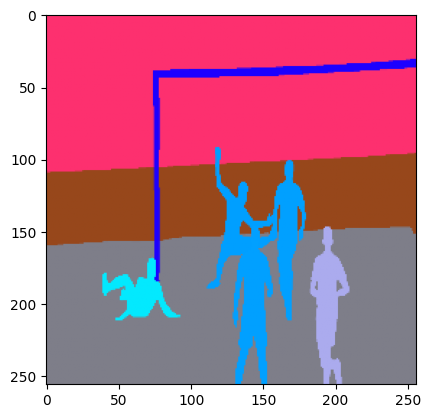

In [ ]:
plt.imshow(images[0])

# Load images data with mask

In [ ]:
# This code doesn't sort the images. Sorting images is required for corresponding training.


# def load_data(folder_path, image_suffix, mask_suffix):
#     images = []
#     masks = []

#     for filename in os.listdir(folder_path):
#         if filename.endswith(image_suffix):
#             image_path = os.path.join(folder_path, filename)
#             print(image_path)

#             # Read and preprocess images
#             image = cv2.imread(image_path)
#             image = cv2.resize(image, (256, 256))  # adjust the size as needed
#             image = image / 255.0  # normalize to [0, 1]
#             images.append(image)


#         elif filename.endswith(mask_suffix):
#             mask_path = os.path.join(folder_path, filename)

#             # Read and preprocess masks
#             mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
#             mask = cv2.resize(mask, (256, 256))  # adjust the size as needed
#             mask = np.expand_dims(mask, axis=-1)  # add channel dimension
#             mask = mask / 255.0  # normalize to [0, 1]
#             masks.append(mask)

#     return np.array(images), np.array(masks)


# Specify your data folder and suffixes

# data_folder = '/content/drive/MyDrive/ColabNotebooks/ImageSegmentation/ImageSegmentationData/images'
# image_suffix = ').jpg'
# mask_suffix = 'fuse.png'



In [ ]:
# This cell get the paths of both images and masks and sort them.

import re
def get_paths(folder_path, image_suffix, mask_suffix):
    images = []
    masks = []
    img_paths = []
    masks_paths = []

    for filename in os.listdir(folder_path):
        if filename.endswith(image_suffix):
            image_path = os.path.join(folder_path, filename)
            img_paths.append(image_path)

        elif filename.endswith(mask_suffix):
            mask_path = os.path.join(folder_path, filename)
            masks_paths.append(mask_path)

    # sorting the image paths
    pattern = re.compile(r"Frame\s*1\s*\((\d+)\)\.jpg")

    # Define a function to extract the frame number from the path
    def extract_frame_number(path):
        match = pattern.search(path)
        return int(match.group(1)) if match else 0

    # Sort image paths based on the extracted frame numbers numerically
    sorted_image_paths = sorted(img_paths, key=extract_frame_number)

    # Now 'sorted_image_paths' contains the sorted image paths
    for path in sorted_image_paths:
        print(path)



    # Sorting the mask paths
    pattern_mask = re.compile(r"Frame\s*1\s*\((\d+)\).jpg___fuse.png")

    def extract_frame_number_mask(path):
        match = pattern_mask.search(path)
        return int(match.group(1)) if match else 0

    sorted_mask_paths = sorted(masks_paths, key=extract_frame_number_mask)

    for path in sorted_mask_paths:
        print("Mask:", path)

    return img_paths, masks_paths


In [ ]:
# Specify your data folder and suffixes
data_folder = '/content/drive/MyDrive/ColabNotebooks/ImageSegmentation/ImageSegmentationData/images'
image_suffix = ').jpg'
mask_suffix = 'fuse.png'


In [ ]:
# Load the images
image_paths, masks_paths = get_paths(data_folder, image_suffix, mask_suffix)
# we train models in numpy array format

/content/drive/MyDrive/ColabNotebooks/ImageSegmentation/ImageSegmentationData/images/Frame 1  (1).jpg
/content/drive/MyDrive/ColabNotebooks/ImageSegmentation/ImageSegmentationData/images/Frame 1  (2).jpg
/content/drive/MyDrive/ColabNotebooks/ImageSegmentation/ImageSegmentationData/images/Frame 1  (3).jpg
/content/drive/MyDrive/ColabNotebooks/ImageSegmentation/ImageSegmentationData/images/Frame 1  (4).jpg
/content/drive/MyDrive/ColabNotebooks/ImageSegmentation/ImageSegmentationData/images/Frame 1  (5).jpg
/content/drive/MyDrive/ColabNotebooks/ImageSegmentation/ImageSegmentationData/images/Frame 1  (6).jpg
/content/drive/MyDrive/ColabNotebooks/ImageSegmentation/ImageSegmentationData/images/Frame 1  (7).jpg
/content/drive/MyDrive/ColabNotebooks/ImageSegmentation/ImageSegmentationData/images/Frame 1  (8).jpg
/content/drive/MyDrive/ColabNotebooks/ImageSegmentation/ImageSegmentationData/images/Frame 1  (9).jpg
/content/drive/MyDrive/ColabNotebooks/ImageSegmentation/ImageSegmentationData/imag

In [ ]:
# This cell read the images , resize the images and then the normalized images in array format
def load_data(image_paths, masks_paths):
    images = []
    masks = []

    # Image Paths
    for image_path in image_paths:
      print('Processing Image: ', image_path)
      image = cv2.imread(image_path)
      image = cv2.resize(image, (256, 256))  # adjust the size as needed
      image = image / 255.0  # normalize to [0, 1]
      images.append(image)

      # Masks Paths
    for masks_path in masks_paths:
      print('Processing Mask: ', masks_path)
      mask = cv2.imread(masks_path, cv2.IMREAD_GRAYSCALE)
      mask = cv2.resize(mask, (256, 256))  # adjust the size as needed
      mask = np.expand_dims(mask, axis=-1)  # add channel dimension
      mask = mask / 255.0  # normalize to [0, 1]
      masks.append(mask)

    return np.array(images), np.array(masks)



In [ ]:
# Load the images
images, masks = load_data(image_paths, masks_paths)
# we train models in numpy array format

Processing Image:  /content/drive/MyDrive/ColabNotebooks/ImageSegmentation/ImageSegmentationData/images/Frame 1  (12).jpg
Processing Image:  /content/drive/MyDrive/ColabNotebooks/ImageSegmentation/ImageSegmentationData/images/Frame 1  (100).jpg
Processing Image:  /content/drive/MyDrive/ColabNotebooks/ImageSegmentation/ImageSegmentationData/images/Frame 1  (16).jpg
Processing Image:  /content/drive/MyDrive/ColabNotebooks/ImageSegmentation/ImageSegmentationData/images/Frame 1  (20).jpg
Processing Image:  /content/drive/MyDrive/ColabNotebooks/ImageSegmentation/ImageSegmentationData/images/Frame 1  (13).jpg
Processing Image:  /content/drive/MyDrive/ColabNotebooks/ImageSegmentation/ImageSegmentationData/images/Frame 1  (17).jpg
Processing Image:  /content/drive/MyDrive/ColabNotebooks/ImageSegmentation/ImageSegmentationData/images/Frame 1  (19).jpg
Processing Image:  /content/drive/MyDrive/ColabNotebooks/ImageSegmentation/ImageSegmentationData/images/Frame 1  (23).jpg
Processing Image:  /con

In [ ]:
# Splitting the data
train_images, val_test_images, train_masks, val_test_masks = train_test_split(images, masks, test_size=0.2, random_state=42)
val_images, test_images, val_masks, test_masks = train_test_split(val_test_images, val_test_masks, test_size=0.5, random_state=42)


#U-Net model

In [ ]:

def unet_model(input_size=(256, 256, 3)):
    inputs = Input(input_size)

    # Encoder
    conv1 = Conv2D(64, 3, activation='relu', padding='same')(inputs)
    conv1 = Conv2D(64, 3, activation='relu', padding='same')(conv1)
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)

    conv2 = Conv2D(128, 3, activation='relu', padding='same')(pool1)
    conv2 = Conv2D(128, 3, activation='relu', padding='same')(conv2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)

    conv3 = Conv2D(256, 3, activation='relu', padding='same')(pool2)
    conv3 = Conv2D(256, 3, activation='relu', padding='same')(conv3)
    pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)

    # Bottom
    conv4 = Conv2D(512, 3, activation='relu', padding='same')(pool3)
    conv4 = Conv2D(512, 3, activation='relu', padding='same')(conv4)

    # Decoder
    up5 = concatenate([UpSampling2D(size=(2, 2))(conv4), conv3], axis=-1)
    conv5 = Conv2D(256, 3, activation='relu', padding='same')(up5)
    conv5 = Conv2D(256, 3, activation='relu', padding='same')(conv5)

    up6 = concatenate([UpSampling2D(size=(2, 2))(conv5), conv2], axis=-1)
    conv6 = Conv2D(128, 3, activation='relu', padding='same')(up6)
    conv6 = Conv2D(128, 3, activation='relu', padding='same')(conv6)

    up7 = concatenate([UpSampling2D(size=(2, 2))(conv6), conv1], axis=-1)
    conv7 = Conv2D(64, 3, activation='relu', padding='same')(up7)
    conv7 = Conv2D(64, 3, activation='relu', padding='same')(conv7)

    # Output layer
    outputs = Conv2D(1, 1, activation='sigmoid')(conv7)

    model = Model(inputs=inputs, outputs=outputs)
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    return model

In [ ]:
# Create and compile the model
model = unet_model()
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 256, 256, 64)         1792      ['input_1[0][0]']             
                                                                                                  
 conv2d_1 (Conv2D)           (None, 256, 256, 64)         36928     ['conv2d[0][0]']              
                                                                                                  
 max_pooling2d (MaxPooling2  (None, 128, 128, 64)         0         ['conv2d_1[0][0]']            
 D)                                                                                           

In [ ]:
# Train the model
model.fit(train_images, train_masks, epochs=10, validation_data=(val_images, val_masks))

Epoch 1/10
3/3 [==============================] - 105s 21s/step - loss: 0.6920 - accuracy: 9.5367e-07 - val_loss: 0.6918 - val_accuracy: 0.0000e+00
Epoch 2/10
3/3 [==============================] - 3s 1s/step - loss: 0.6917 - accuracy: 1.3351e-06 - val_loss: 0.6911 - val_accuracy: 0.0000e+00
Epoch 3/10
3/3 [==============================] - 4s 1s/step - loss: 0.6910 - accuracy: 1.3351e-06 - val_loss: 0.6904 - val_accuracy: 0.0000e+00
Epoch 4/10
3/3 [==============================] - 3s 1s/step - loss: 0.6904 - accuracy: 1.3351e-06 - val_loss: 0.6912 - val_accuracy: 0.0000e+00
Epoch 5/10
3/3 [==============================] - 4s 1s/step - loss: 0.6906 - accuracy: 1.3351e-06 - val_loss: 0.6905 - val_accuracy: 0.0000e+00
Epoch 6/10
3/3 [==============================] - 3s 1s/step - loss: 0.6908 - accuracy: 1.3351e-06 - val_loss: 0.6899 - val_accuracy: 0.0000e+00
Epoch 7/10
3/3 [==============================] - 3s 1s/step - loss: 0.6901 - accuracy: 1.3351e-06 - val_loss: 0.6897 - val_acc

In [ ]:
# Evaluate the model on the test set
results = model.evaluate(test_images, test_masks)
print("Test Loss:", results[0])
print("Test Accuracy:", results[1])

1/1 [==============================] - 0s 224ms/step - loss: 0.6898 - accuracy: 0.0000e+00
Test Loss: 0.6897724866867065
Test Accuracy: 0.0


# Data Visualization

In [ ]:
def visualize(original, mask, predicted_mask=None):
    plt.figure(figsize=(12, 4))

    # Original Image
    plt.subplot(1, 3, 1)
    plt.imshow(original)
    plt.title('Original Image')

    # Ground Truth Mask
    plt.subplot(1, 3, 2)
    plt.imshow(np.squeeze(mask), cmap='gray')
    plt.title('Ground Truth Mask')

    # Predicted Mask (if available)
    if predicted_mask is not None:
        plt.subplot(1, 3, 3)
        plt.imshow(np.squeeze(predicted_mask), cmap = 'ocean') #BrBG, Paired, inferno,
        plt.title('Predicted Mask')

    plt.show()

1/1 [==============================] - 0s 19ms/step


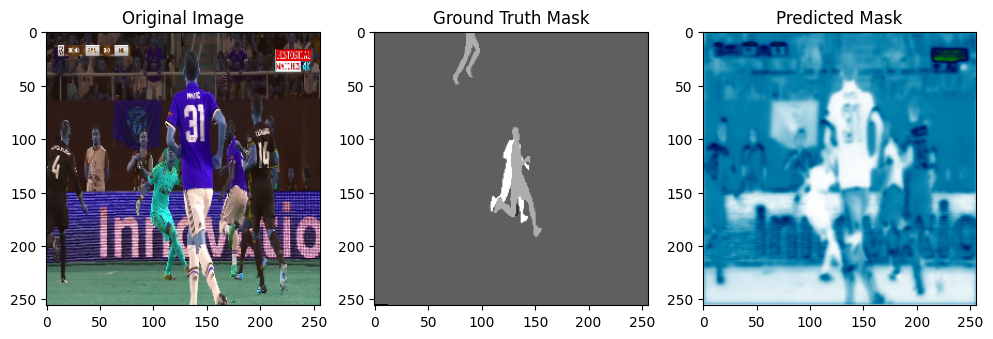

1/1 [==============================] - 0s 19ms/step


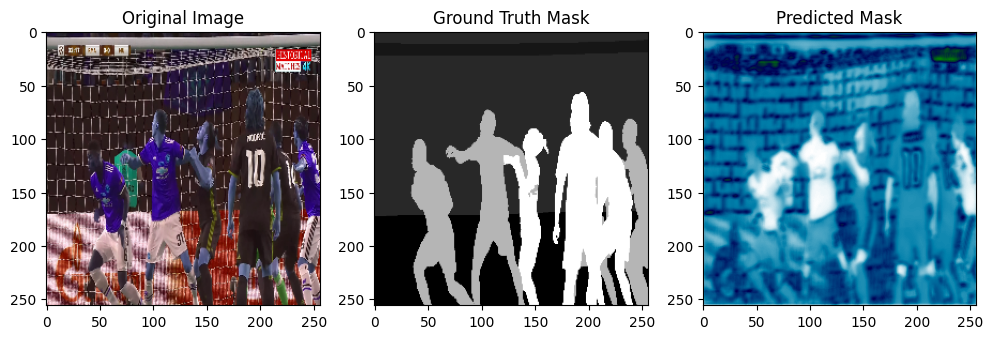

1/1 [==============================] - 0s 25ms/step


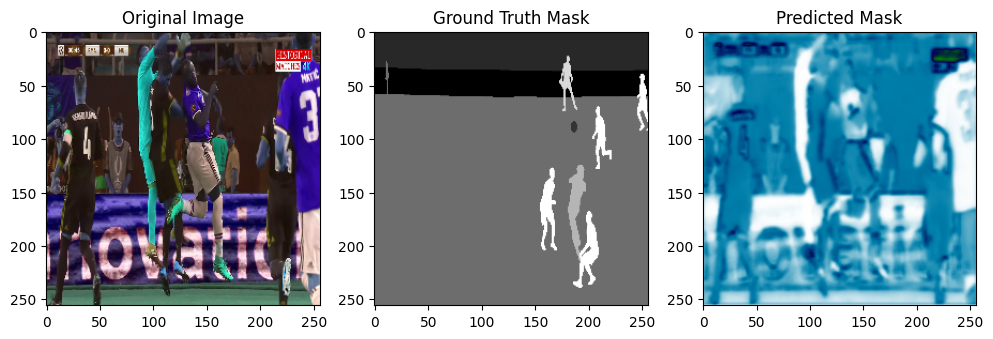

1/1 [==============================] - 0s 24ms/step


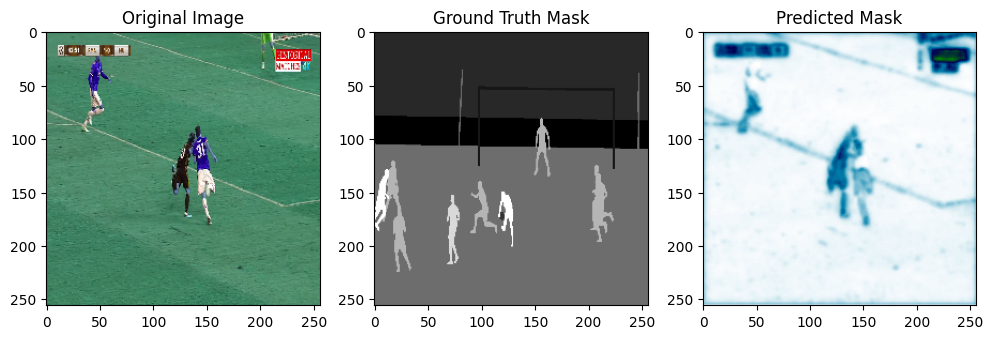

1/1 [==============================] - 0s 27ms/step


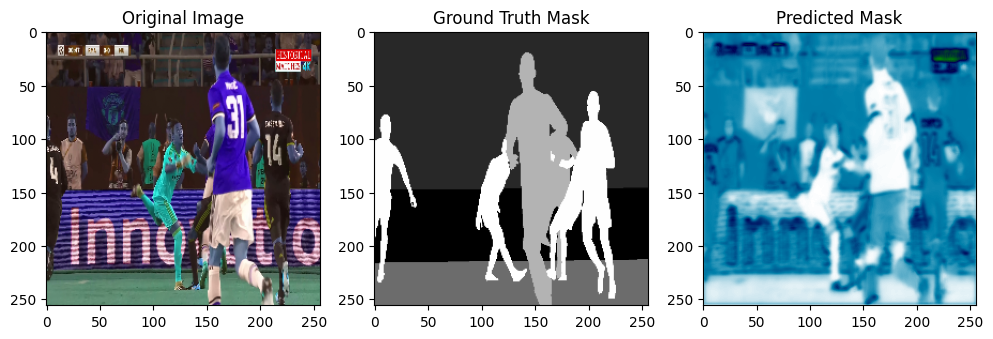

In [ ]:
 # Visualize some examples
for i in range(5):  # Visualize 5 examples
    index = np.random.randint(0, len(test_images))
    sample_image = test_images[index]
    sample_mask = test_masks[index]

    # Reshape the input for prediction
    sample_image = np.expand_dims(sample_image, axis=0)

    # Predict the mask using the trained model
    predicted_mask = model.predict(sample_image)

    # Visualize the images and masks
    visualize(sample_image[0], sample_mask, predicted_mask)

# Errors and Helping Codes

In [ ]:
def load_data(folder_path, image_suffix, mask_suffix):
    images = []
    masks = []

    for filename in os.listdir(folder_path):
        if filename.endswith(image_suffix):
            image_path = os.path.join(folder_path, filename)
            mask_path = os.path.join(folder_path, filename.replace(image_suffix, mask_suffix))
            print('Image Path: ',image_path)
            print('MAsk Path: ', mask_path)


            # Read and preprocess images
            image = cv2.imread(image_path)
            mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
            cv2_imshow(image)
            cv2_imshow(mask)

            if image is not None and mask is not None:
                image = cv2.resize(image, (256, 256))  # adjust the size as needed
                image = image / 255.0  # normalize to [0, 1]
                images.append(image)

                mask = cv2.resize(mask, (256, 256))  # adjust the size as needed
                mask = np.expand_dims(mask, axis=-1)  # add channel dimension
                mask = mask / 255.0  # normalize to [0, 1]
                masks.append(mask)
            else:
                print(f"Error loading images for {filename}")

    return np.array(images), np.array(masks)


In [ ]:

images, masks = load_data(data_folder, image_suffix, mask_suffix)

# Ensure you have enough samples in your dataset
if len(images) == 0:
    raise ValueError("There are no images in the dataset.")

# Use a smaller test_size or adjust n_samples if needed
train_images, test_images, train_masks, test_masks = train_test_split(
    images, masks, test_size=0.1, random_state=42
)

Image Path:  /content/drive/MyDrive/ColabNotebooks/ImageSegmentation/ImageSegmentationData/images/Frame 1  (12).jpg
MAsk Path:  /content/drive/MyDrive/ColabNotebooks/ImageSegmentation/ImageSegmentationData/images/Frame 1  (12jpg___fuse


DisabledFunctionError: ignored